## Probabilistic Learning on Manifolds (MSA of a 12-story RC frame)

In this example, raw data from MSA of a 12-story RC frame is used as sample input. The interested engineering demand parameters include maximum story drift ratio and peak floor acceleration. The intensity measures for quantifying the ground motion characeteristics include pseudo spectral acceleration $Sa(T_1)$, response spectral shape measture $SaRatio$, and 5-75% significant duration $D_{S5-75}$.

The input sample included 472 data points (from six intensity levels in MSA) and each features an unique vector of intensity measures and engineering demand parameters. The goal is to use PLoM learn the data structure and generate more samples whose key statistics (i.e., mean and covariance) are consistent with the input sample.

### Import python modules

In [31]:
import numpy as np
import random
import time
from math import pi
import pandas as pd
from ctypes import *
%matplotlib notebook
import matplotlib.pyplot as plt
import sys

### Import PLoM modules

In [32]:
sys.path.insert(1, '../../')
import PLoM_library_ubuntu as plom

In [33]:
t_start = time.time()

### Load Multi-Stripe Analysis (MSA) Data
MSA data are loaded via a comma-separate value (csv) file. The first row contains column names for both predictors (X) and responses (y). The following rows are input sample data. Users are expected to specif the csv filename.

<IPython.core.display.Javascript object>


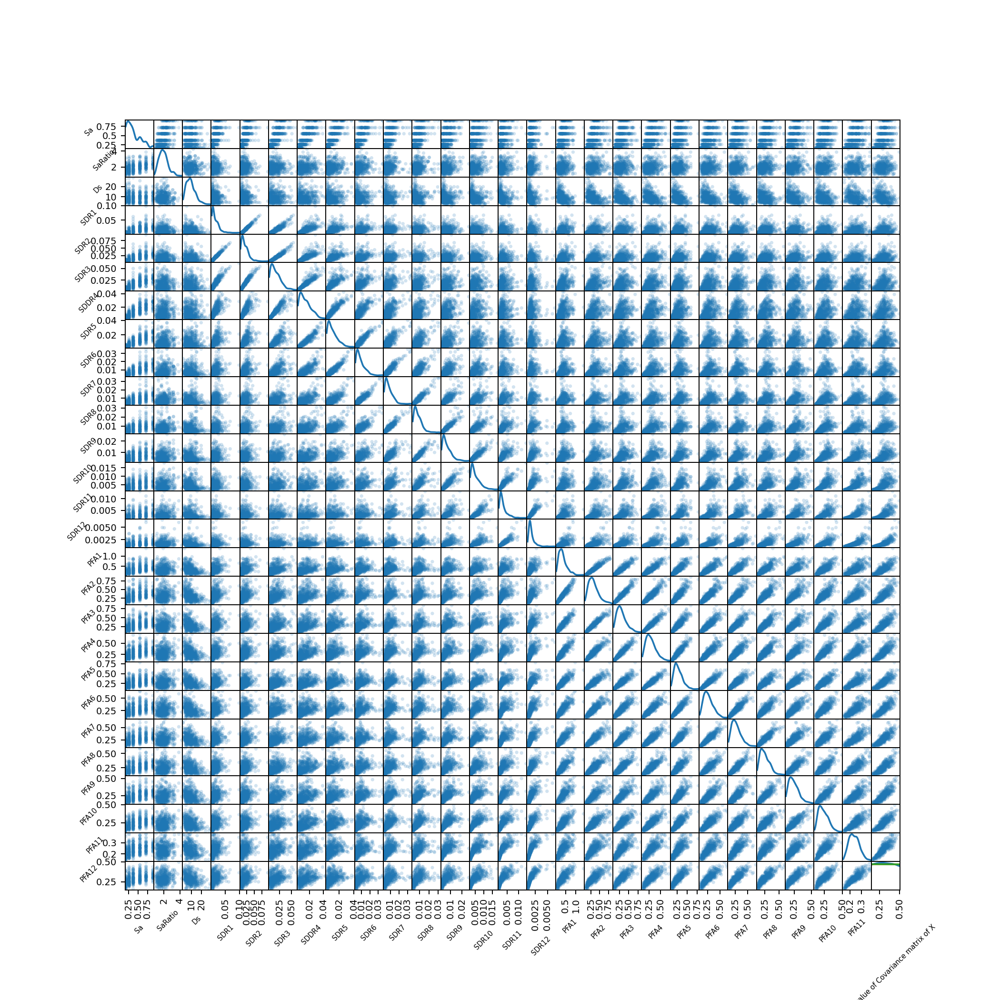

In [34]:
# Filename
filename = './data/response_rcf12_msa_la_nc.csv'
df = pd.read_csv(filename, header=0, index_col=None)

# Initialize x
N = len(df.index)
n = len(df.columns)
x0 = np.zeros((n, N))
x_name = []

# Read data
for i in range(n):
    x0[i] = [np.log(x) for x in df.iloc[:, i].values.tolist()]
    x_name.append(df.columns[i])
    
# Plot scatter matrix of the sample
smp = pd.plotting.scatter_matrix(df, alpha=0.2, diagonal = "kde", figsize=(12, 12))
for ax in smp.ravel():
    ax.set_xlabel(ax.get_xlabel(), fontsize = 6, rotation = 45)
    ax.set_ylabel(ax.get_ylabel(), fontsize = 6, rotation = 45)

### User Specified Parameter
Please specify tuning parameters in this section

In [3]:
epsilon_pca = 1e-6 # tolerance for selecting the number of considered components
epsilon_kde = 25 # smoothing parameter in the kernel density
n_mc = 20 # realization/sample size ratio

### Step 0: Scaling the data

In [35]:
def g_c(x): #x can be a column vector or a matrix
    f = np.zeros((2, x.shape[1]))
    f[0,:] = x[0,:]
    f[1,:] = x[0,:]**2
    return f

x, alpha, x_min = plom.scaling(x0)

x_mean = plom.mean(x)

N = x.shape[1] #initial number of points
n = x.shape[0] #initial dimension

### Step 1: Principal Component Analysis (PCA)

Considered number of components:  27


<IPython.core.display.Javascript object>


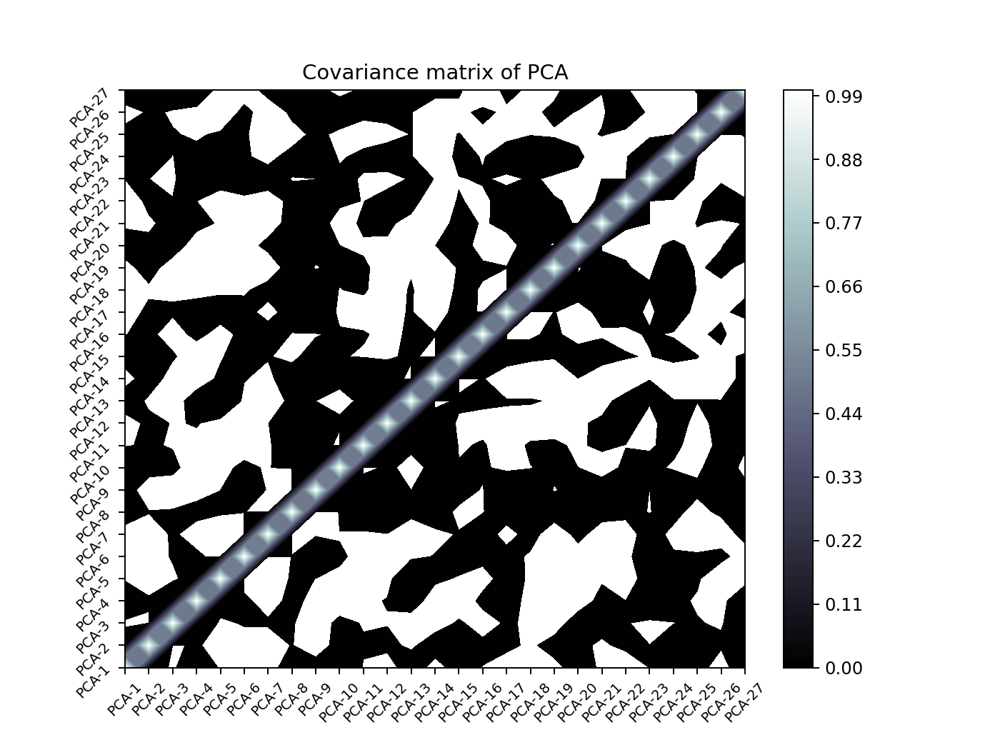

In [36]:
(eta, mu, phi) = plom.PCA(x, epsilon_pca)
nu = len(eta)
print('Considered number of components: ', nu)

plom.covariance(eta)

# Plot covariance matrix
fig, ax = plt.subplots(figsize=(8,6))
ctp = ax.contourf(plom.covariance(eta), cmap=plt.cm.bone, levels=100)
ax.set_xticks(list(range(n)))
ax.set_yticks(list(range(n)))
ax.set_xticklabels(['PCA-'+str(x+1) for x in range(n)], fontsize=8, rotation=45)
ax.set_yticklabels(['PCA-'+str(x+1) for x in range(n)], fontsize=8, rotation=45)
ax.set_title('Covariance matrix of PCA')
cbar = fig.colorbar(ctp)
plt.show()

### Step 2: Kernel Density Estimation (KDE)

m:  32


<IPython.core.display.Javascript object>


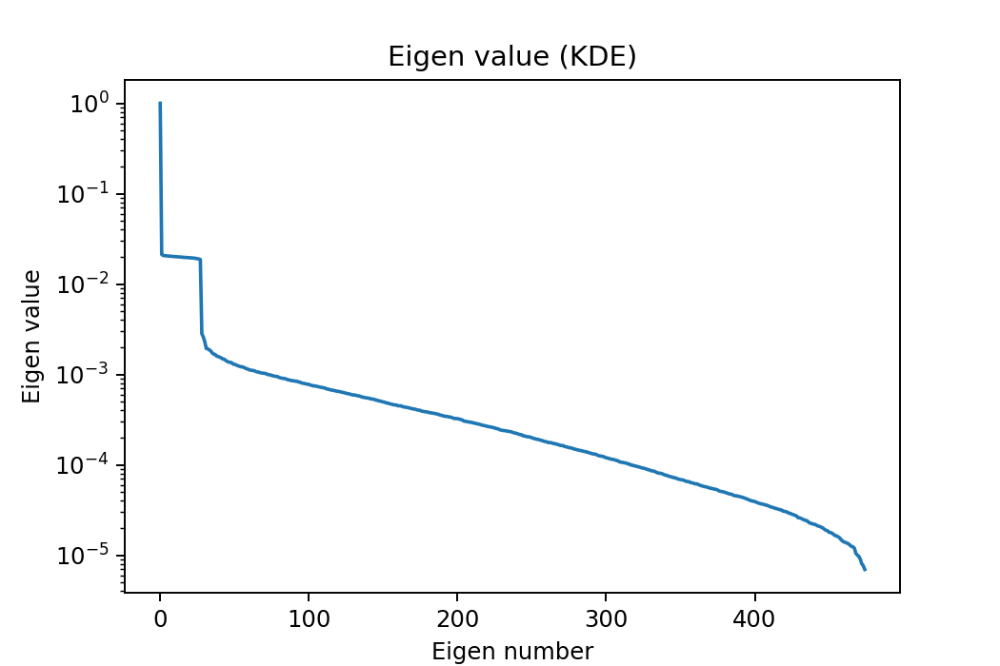

In [37]:
(s_v, c_v, hat_s_v) = plom.parameters_kde(eta)

K, b = plom.K(eta,epsilon_kde)

g, eigenvalues = plom.g(K,b) #diffusion maps
g = g.real
eigenvalues = eigenvalues.real
m = plom.m(eigenvalues)
print('m: ', m)
a = g[:,0:m].dot(np.linalg.inv(np.transpose(g[:,0:m]).dot(g[:,0:m])))

# Plot
fig, ax = plt.subplots(figsize=(6,4))
ax.semilogy(np.arange(len(eigenvalues)), eigenvalues)
ax.set_xlabel('Eigen number')
ax.set_ylabel('Eigen value')
ax.set_title('Eigen value (KDE)')
plt.show()

### Step 3: Create the generator

delta t:  0.1916302934299121


<IPython.core.display.Javascript object>


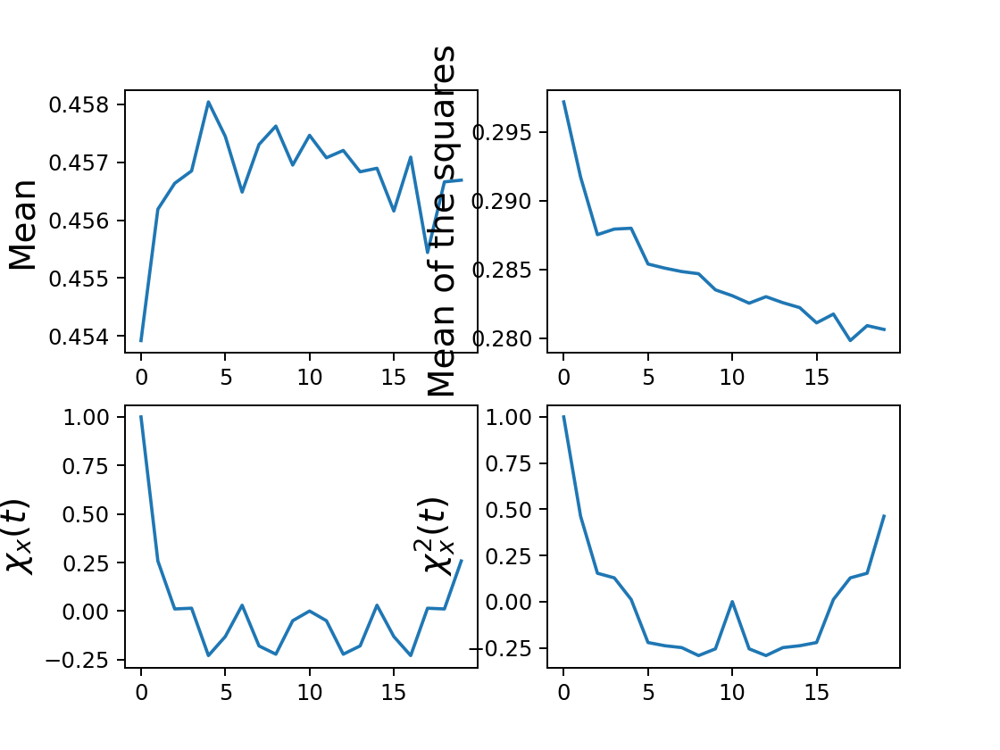

In [38]:
eta_init = eta #use the sample as the initial vector
nu_init = np.random.normal(size = (nu,N))


z_init = eta_init.dot(a)
y_init = nu_init.dot(a)

# Create the generator
eta_lambda, nu_lambda, x_, x_2 = plom.generator(z_init, y_init, a,\
                        n_mc, x_mean, eta, s_v, hat_s_v, mu, phi, g[:,0:m]) #solve the ISDE in n_mc iterations

plt.figure()
plt.subplot(2,2,1)
plt.plot(x_[0,:])
plt.ylabel('Mean',fontsize=16)

plt.subplot(2,2,2)
plt.plot(x_2[0,:])
plt.ylabel('Mean of the squares',fontsize=16)

plt.subplot(2,2,3)
chi = plom.ac(x_[0,:(n_mc//2)])
plt.plot(chi[:chi.size]/chi[0])
plt.ylabel(r'$\chi_x(t)$',fontsize=16)

plt.subplot(2,2,4)
chi = plom.ac(x_2[0,:(n_mc//2)])
plt.plot(chi[:chi.size]/chi[0])
plt.ylabel(r'$\chi_x^{2}(t)$',fontsize=16)
plt.show()
plt.savefig('realization.png')



### Step 4: New realizations (MCMC)

In [39]:
# Transform \eta back to X
x_c = x_mean + phi.dot(np.diag(mu)).dot(eta_lambda)

# Unscale X
x_c = np.diag(alpha).dot(x_c)+x_min
x = np.diag(alpha).dot(x)+x_min


plom.mean(x_c[:,:])
x_c.shape

# Save data
np.savetxt('sample.csv', np.exp(x), delimiter=',')
np.savetxt('simulation.csv', np.exp(x_c), delimiter=',')

t_end = time.time()
print("Time: " + str(t_end - t_start) + ' sec.')

Time: 36.10073637962341 sec.


### Post-processing
We would like to check the basic statistics of the input sample (i.e., MSA) and the generated new realizations by PLoM. The key metrics include the median, standard deviation, and correlation coefficient matrix of different structural responses.

<IPython.core.display.Javascript object>


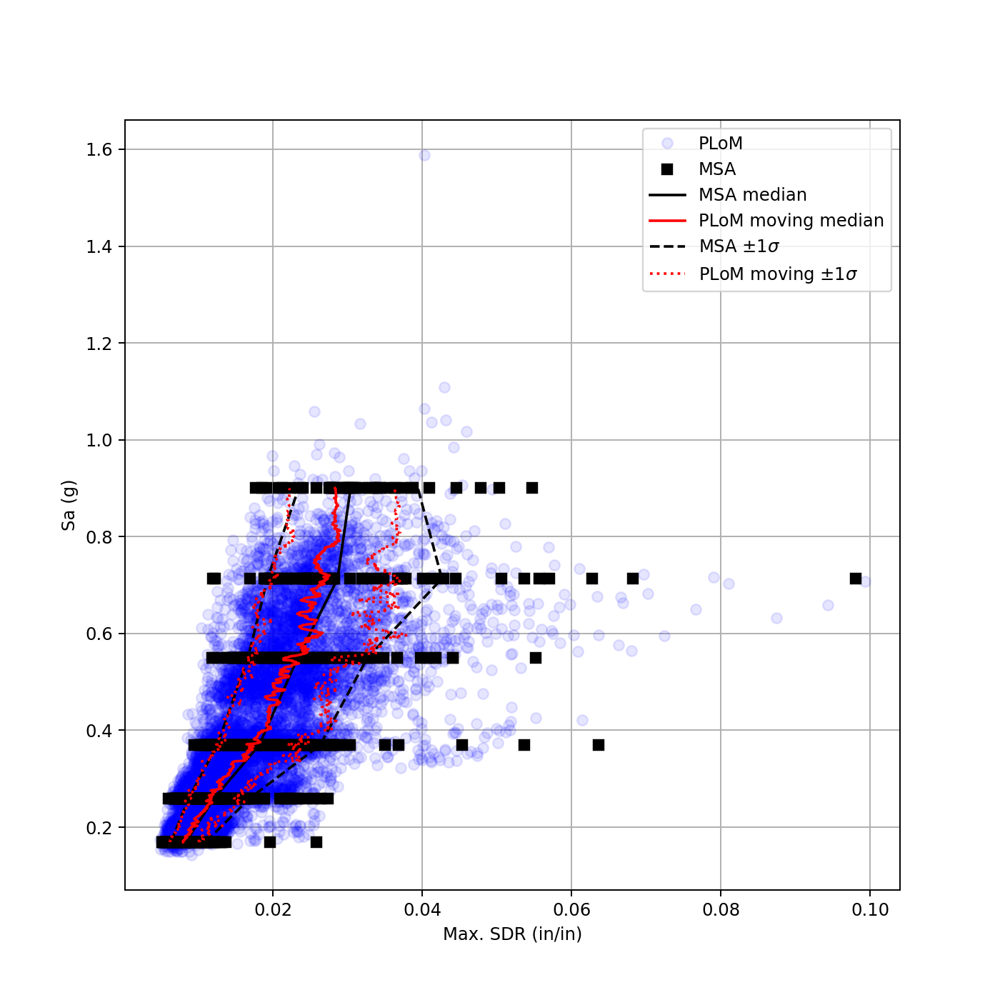

In [40]:
# Maximum story drift ratio in the building
# Note: the SDR are in the rows # 4 ~ # 15
sa_msa = np.exp(x0[0,:])
sa_plom = np.exp(x_c[0,:])
sdr_max_msa = np.max(np.exp(x0[3:15,:]), axis=0)
sdr_max_plom = np.max(np.exp(x_c[3:15,:]), axis=0)

iml = [0.1690, 0.2594, 0.3696, 0.5492, 0.7131, 0.9000]
sdr_max_med_msa = [np.exp(np.mean(np.log(sdr_max_msa[x0[0,:]==np.log(iml_x)]))) for iml_x in iml]
sdr_max_std_msa = [np.std(np.log(sdr_max_msa[x0[0,:]==np.log(iml_x)])) for iml_x in iml]

iml2 = np.linspace(np.min(iml),np.max(iml),500)
num_nb = 100
sdr_max_med_plom = [np.exp(np.mean(np.log(sdr_max_plom[abs(x_c[0,:]-np.log(iml_x)).argsort()[0:num_nb]]))) for iml_x in iml2]
sdr_max_std_plom = [np.std(np.log(sdr_max_plom[abs(x_c[0,:]-np.log(iml_x)).argsort()[0:num_nb]])) for iml_x in iml2]

fig, ax = plt.subplots(figsize=(8,8))
ax.plot(sdr_max_plom, sa_plom, 'bo', alpha=0.1, label='PLoM')
ax.plot(sdr_max_msa, sa_msa, 'ks', label='MSA')
ax.plot(sdr_max_med_msa, iml, 'k-', label='MSA median')
ax.plot(sdr_max_med_plom, iml2, 'r-', label='PLoM moving median')
ax.plot(sdr_max_med_msa*np.exp(sdr_max_std_msa), iml, 'k--', label='MSA $\pm$1$\sigma$')
ax.plot(sdr_max_med_plom*np.exp(sdr_max_std_plom), iml2, 'r:', label='PLoM moving $\pm$1$\sigma$')
ax.plot(sdr_max_med_msa/np.exp(sdr_max_std_msa), iml, 'k--')
ax.plot(sdr_max_med_plom/np.exp(sdr_max_std_plom), iml2, 'r:')

ax.set_xlabel('Max. SDR (in/in)')
ax.set_ylabel('Sa (g)')
ax.legend()
ax.grid()
plt.show()

<IPython.core.display.Javascript object>


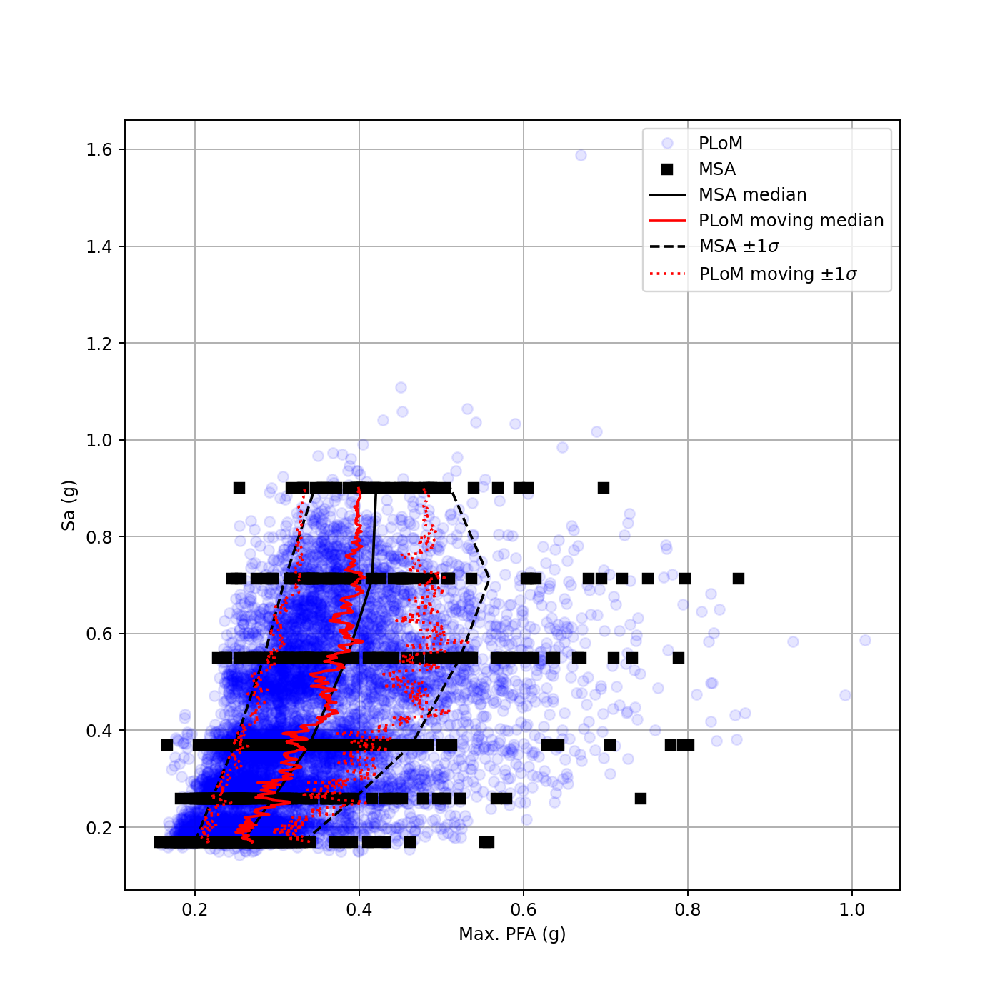

In [41]:
# Peak story acceleration in the building
# Note: the PFA are in the rows # 16 ~ # 27
sa_msa = np.exp(x0[0,:])
sa_plom = np.exp(x_c[0,:])
pfa_max_msa = np.max(np.exp(x0[16:27,:]), axis=0)
pfa_max_plom = np.max(np.exp(x_c[16:27,:]), axis=0)

iml = [0.1690, 0.2594, 0.3696, 0.5492, 0.7131, 0.9000]
pfa_max_med_msa = [np.exp(np.mean(np.log(pfa_max_msa[x0[0,:]==np.log(iml_x)]))) for iml_x in iml]
pfa_max_std_msa = [np.std(np.log(pfa_max_msa[x0[0,:]==np.log(iml_x)])) for iml_x in iml]

iml2 = np.linspace(np.min(iml),np.max(iml),500)
num_nb = 100
pfa_max_med_plom = [np.exp(np.mean(np.log(pfa_max_plom[abs(x_c[0,:]-np.log(iml_x)).argsort()[0:num_nb]]))) for iml_x in iml2]
pfa_max_std_plom = [np.std(np.log(pfa_max_plom[abs(x_c[0,:]-np.log(iml_x)).argsort()[0:num_nb]])) for iml_x in iml2]

fig, ax = plt.subplots(figsize=(8,8))
ax.plot(pfa_max_plom, sa_plom, 'bo', alpha=0.1, label='PLoM')
ax.plot(pfa_max_msa, sa_msa, 'ks', label='MSA')
ax.plot(pfa_max_med_msa, iml, 'k-', label='MSA median')
ax.plot(pfa_max_med_plom, iml2, 'r-', label='PLoM moving median')
ax.plot(pfa_max_med_msa*np.exp(pfa_max_std_msa), iml, 'k--', label='MSA $\pm$1$\sigma$')
ax.plot(pfa_max_med_plom*np.exp(pfa_max_std_plom), iml2, 'r:', label='PLoM moving $\pm$1$\sigma$')
ax.plot(pfa_max_med_msa/np.exp(pfa_max_std_msa), iml, 'k--')
ax.plot(pfa_max_med_plom/np.exp(pfa_max_std_plom), iml2, 'r:')

ax.set_xlabel('Max. PFA (g)')
ax.set_ylabel('Sa (g)')
ax.legend()
ax.grid()
plt.show()

<IPython.core.display.Javascript object>


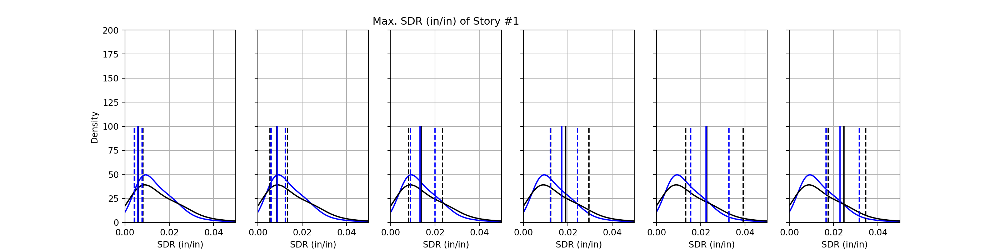

<IPython.core.display.Javascript object>


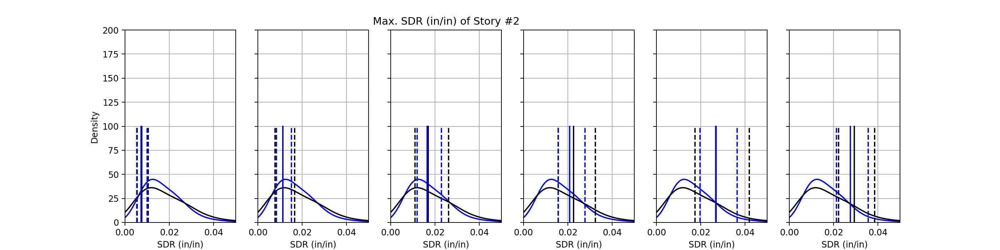

<IPython.core.display.Javascript object>


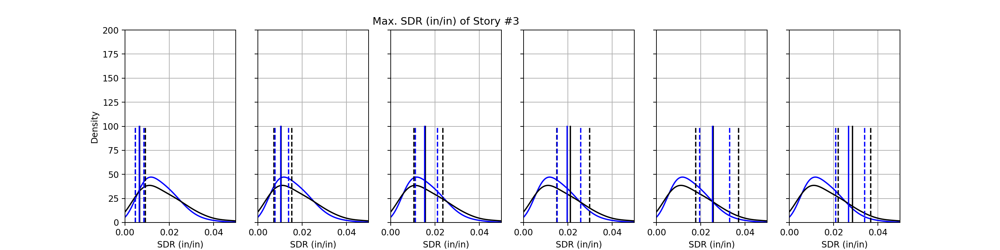

<IPython.core.display.Javascript object>


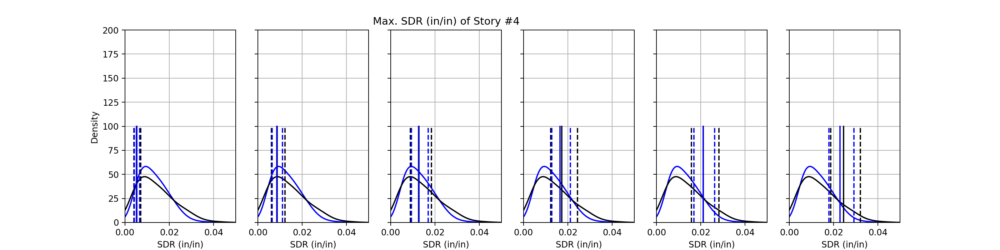

<IPython.core.display.Javascript object>


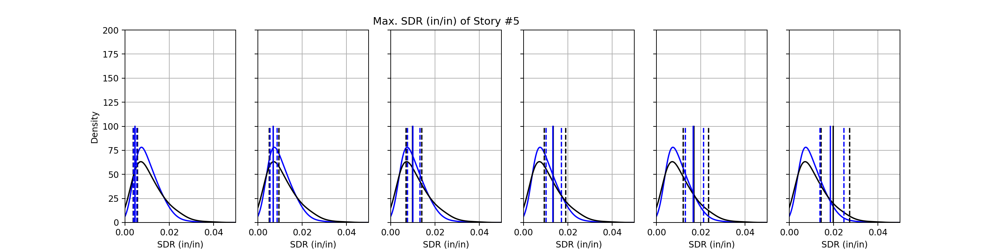

<IPython.core.display.Javascript object>


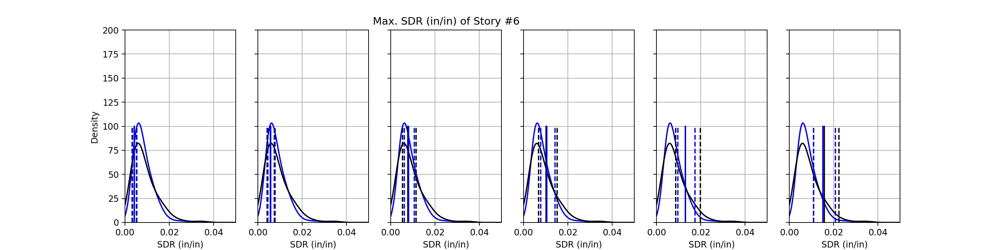

<IPython.core.display.Javascript object>


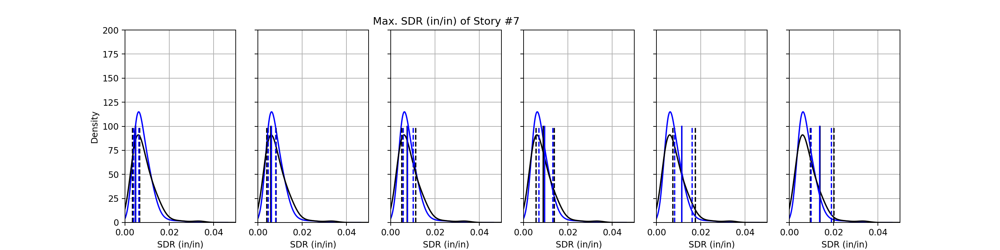

<IPython.core.display.Javascript object>


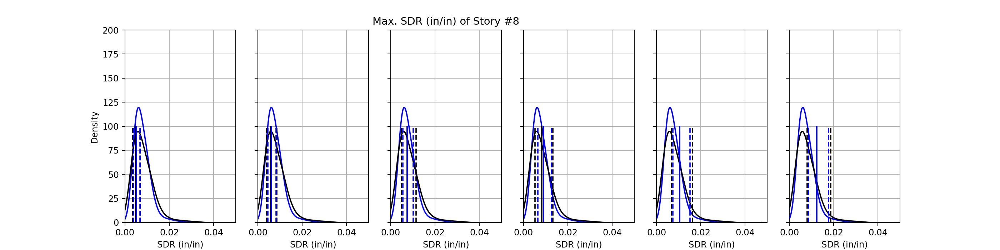

<IPython.core.display.Javascript object>


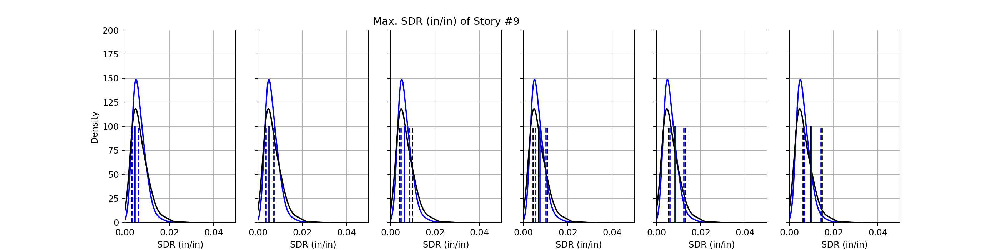

<IPython.core.display.Javascript object>


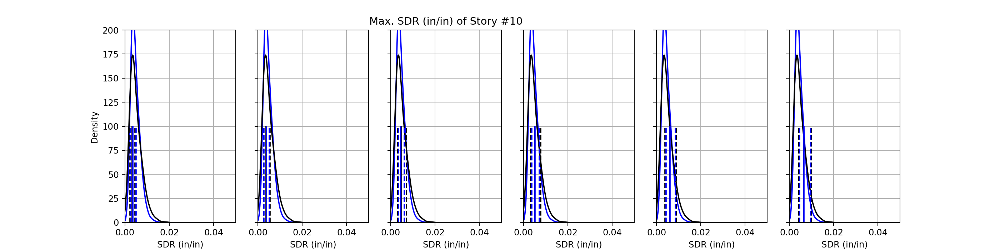

<IPython.core.display.Javascript object>


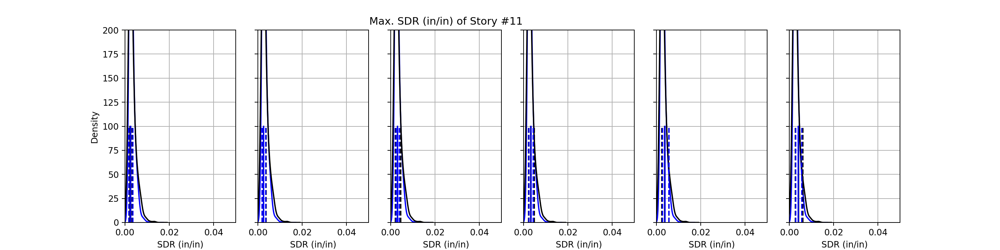

<IPython.core.display.Javascript object>


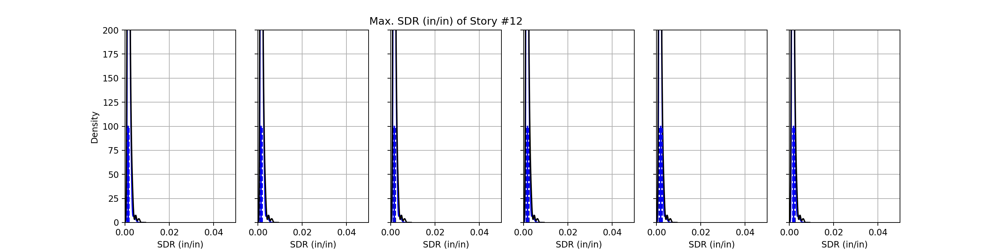

In [42]:
# Story-based responses (SDR)
sa_msa = np.exp(x0[0,:])
sa_plom = np.exp(x_c[0,:])
iml = [0.1690, 0.2594, 0.3696, 0.5492, 0.7131, 0.9000]
for i in range(12):
    sdr_cur_msa = np.exp(x0[i+3,:])
    sdr_cur_plom = np.exp(x_c[i+3,:])
    sdr_cur_med_msa = [np.exp(np.mean(np.log(sdr_cur_msa[x0[0,:]==np.log(iml_x)]))) for iml_x in iml]
    sdr_cur_std_msa = [np.std(np.log(sdr_cur_msa[x0[0,:]==np.log(iml_x)])) for iml_x in iml]

    iml2 = iml
    num_nb = 100
    sdr_cur_med_plom = [np.exp(np.mean(np.log(sdr_cur_plom[abs(x_c[0,:]-np.log(iml_x)).argsort()[0:num_nb]]))) for iml_x in iml2]
    sdr_cur_std_plom = [np.std(np.log(sdr_cur_plom[abs(x_c[0,:]-np.log(iml_x)).argsort()[0:num_nb]])) for iml_x in iml2]
    
    plt.figure(figsize=(16,4))
    for j in range(6):
        plt.subplot(1,6,j+1)
        ax = plt.gca()
        pd.Series(sdr_cur_plom).plot.kde(color='b', bw_method=0.5)
        pd.Series(sdr_cur_msa).plot.kde(color='k', bw_method=0.5)
        ax.plot([sdr_cur_med_msa[j], sdr_cur_med_msa[j]], [0, 100], 'k-')
        ax.plot([sdr_cur_med_msa[j]*np.exp(sdr_cur_std_msa[j]), sdr_cur_med_msa[j]*np.exp(sdr_cur_std_msa[j])], [0, 100], 'k--')
        ax.plot([sdr_cur_med_msa[j]/np.exp(sdr_cur_std_msa[j]), sdr_cur_med_msa[j]/np.exp(sdr_cur_std_msa[j])], [0, 100], 'k--')
        ax.plot([sdr_cur_med_plom[j], sdr_cur_med_plom[j]], [0, 100], 'b-')
        ax.plot([sdr_cur_med_plom[j]*np.exp(sdr_cur_std_plom[j]), sdr_cur_med_plom[j]*np.exp(sdr_cur_std_plom[j])], [0, 100], 'b--')
        ax.plot([sdr_cur_med_plom[j]/np.exp(sdr_cur_std_plom[j]), sdr_cur_med_plom[j]/np.exp(sdr_cur_std_plom[j])], [0, 100], 'b--')
        ax.set_xlim(0.0, 0.05)
        ax.set_ylim(0.0, 200)
        ax.grid()
        ax.set_xlabel('SDR (in/in)')
        if j > 0:
            ax.set_yticklabels('')
            ax.set_ylabel('')
        if j == 2:
            ax.set_title('Max. SDR (in/in) of Story #'+str(i+1))

<IPython.core.display.Javascript object>


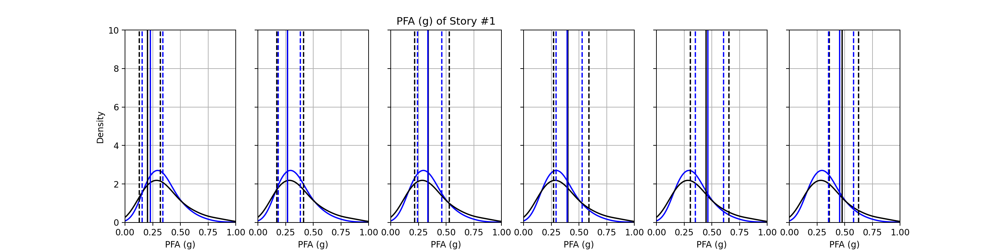

<IPython.core.display.Javascript object>


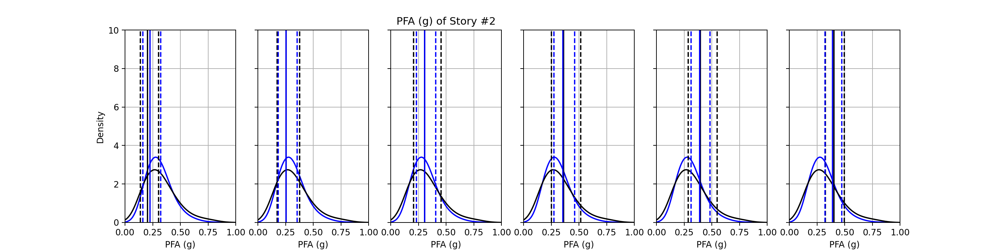

<ipython-input-43-7f3a33c21295>:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(16,4))


<IPython.core.display.Javascript object>


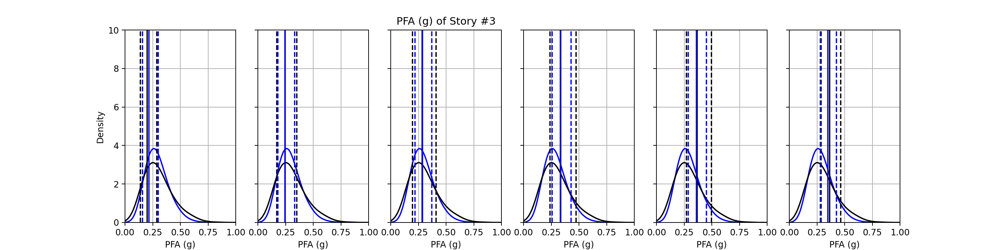

<IPython.core.display.Javascript object>


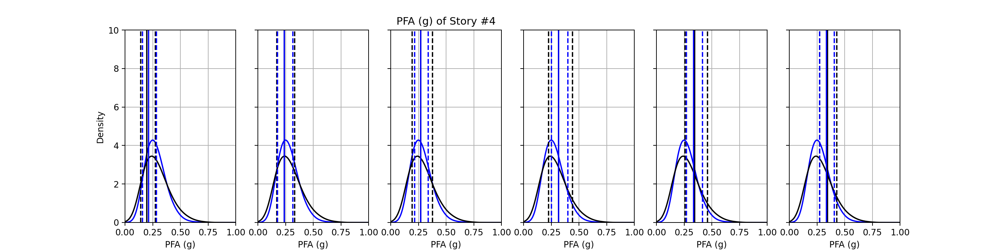

<IPython.core.display.Javascript object>


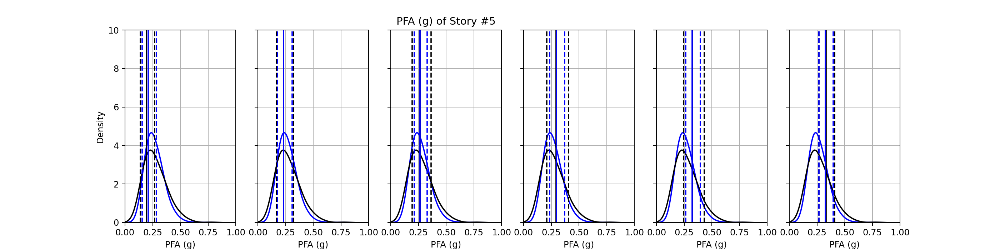

<IPython.core.display.Javascript object>


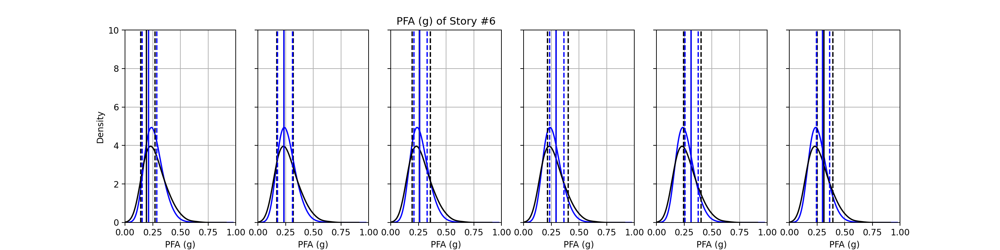

<IPython.core.display.Javascript object>


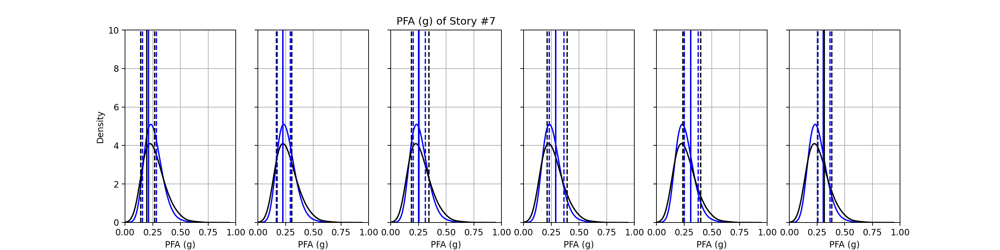

<IPython.core.display.Javascript object>


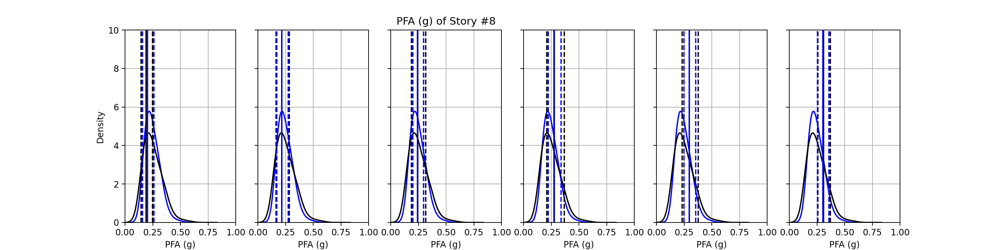

<IPython.core.display.Javascript object>


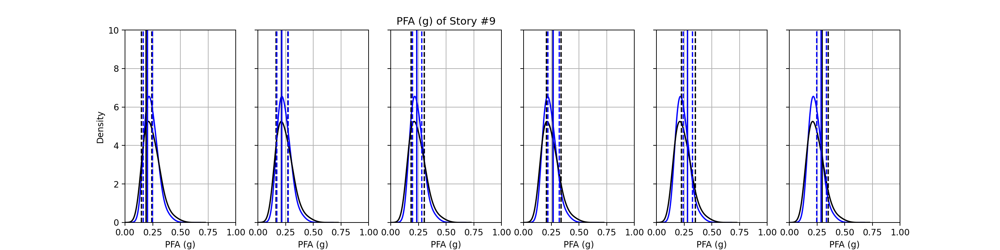

<IPython.core.display.Javascript object>


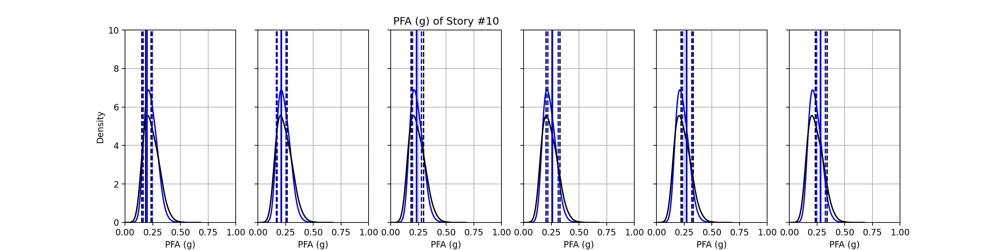

<IPython.core.display.Javascript object>


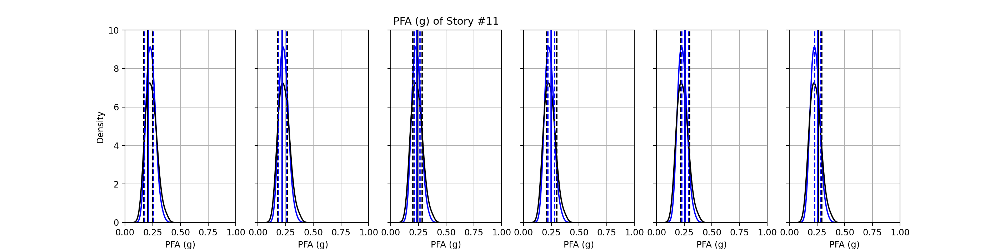

<IPython.core.display.Javascript object>


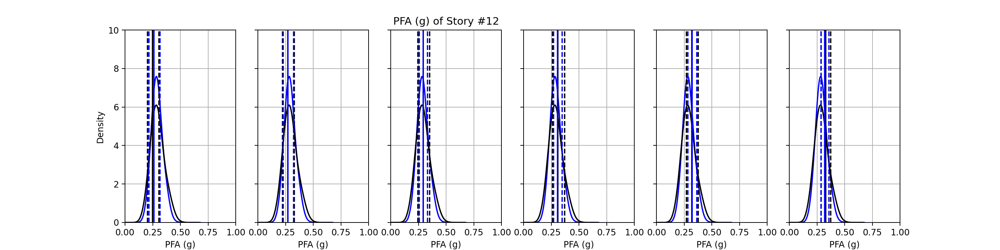

In [43]:
# Story-based responses (PFA)
sa_msa = np.exp(x0[0,:])
sa_plom = np.exp(x_c[0,:])
iml = [0.1690, 0.2594, 0.3696, 0.5492, 0.7131, 0.9000]
for i in range(12):
    pfa_cur_msa = np.exp(x0[i+15,:])
    pfa_cur_plom = np.exp(x_c[i+15,:])
    pfa_cur_med_msa = [np.exp(np.mean(np.log(pfa_cur_msa[x0[0,:]==np.log(iml_x)]))) for iml_x in iml]
    pfa_cur_std_msa = [np.std(np.log(pfa_cur_msa[x0[0,:]==np.log(iml_x)])) for iml_x in iml]

    iml2 = iml
    num_nb = 100
    pfa_cur_med_plom = [np.exp(np.mean(np.log(pfa_cur_plom[abs(x_c[0,:]-np.log(iml_x)).argsort()[0:num_nb]]))) for iml_x in iml2]
    pfa_cur_std_plom = [np.std(np.log(pfa_cur_plom[abs(x_c[0,:]-np.log(iml_x)).argsort()[0:num_nb]])) for iml_x in iml2]
    
    plt.figure(figsize=(16,4))
    for j in range(6):
        plt.subplot(1,6,j+1)
        ax = plt.gca()
        pd.Series(pfa_cur_plom).plot.kde(color='b', bw_method=0.5)
        pd.Series(pfa_cur_msa).plot.kde(color='k', bw_method=0.5)
        ax.plot([pfa_cur_med_msa[j], pfa_cur_med_msa[j]], [0, 100], 'k-')
        ax.plot([pfa_cur_med_msa[j]*np.exp(pfa_cur_std_msa[j]), pfa_cur_med_msa[j]*np.exp(pfa_cur_std_msa[j])], [0, 100], 'k--')
        ax.plot([pfa_cur_med_msa[j]/np.exp(pfa_cur_std_msa[j]), pfa_cur_med_msa[j]/np.exp(pfa_cur_std_msa[j])], [0, 100], 'k--')
        ax.plot([pfa_cur_med_plom[j], pfa_cur_med_plom[j]], [0, 100], 'b-')
        ax.plot([pfa_cur_med_plom[j]*np.exp(pfa_cur_std_plom[j]), pfa_cur_med_plom[j]*np.exp(pfa_cur_std_plom[j])], [0, 100], 'b--')
        ax.plot([pfa_cur_med_plom[j]/np.exp(pfa_cur_std_plom[j]), pfa_cur_med_plom[j]/np.exp(pfa_cur_std_plom[j])], [0, 100], 'b--')
        ax.set_xlim(0.0, 1)
        ax.set_ylim(0.0, 10)
        ax.grid()
        ax.set_xlabel('PFA (g)')
        if j > 0:
            ax.set_yticklabels('')
            ax.set_ylabel('')
        if j == 2:
            ax.set_title('PFA (g) of Story #'+str(i+1))

<IPython.core.display.Javascript object>


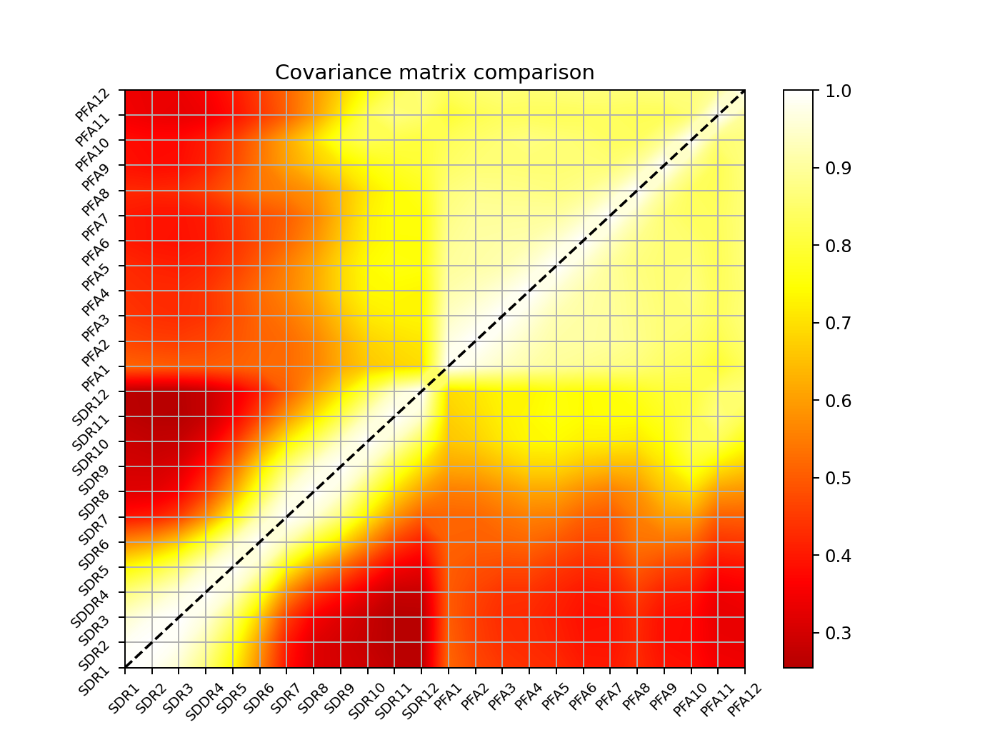

<IPython.core.display.Javascript object>


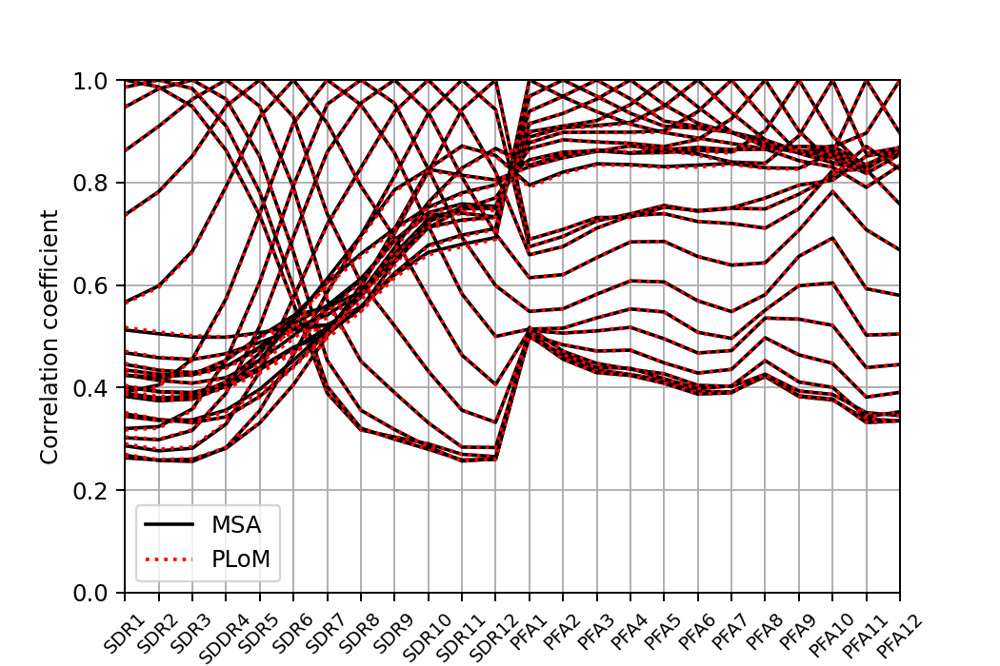

In [97]:
# Correlation coefficient matrix
c_msa = np.corrcoef(x0)
c_plom = np.corrcoef(x_c)
c_combine = c_msa
tmp = np.triu(c_plom).flatten()
tmp = tmp[tmp != 0]
c_combine[np.triu_indices(27)] = tmp

# Plot covariance matrix
fig, ax = plt.subplots(figsize=(8,6))
ctp = ax.contourf(c_combine[3:,3:], cmap=plt.cm.hot, levels=1000)
ctp.set_clim(0,1)
ax.plot([0, 23], [0, 23], 'k--')
ax.set_xticks(list(range(n-3)))
ax.set_yticks(list(range(n-3)))
ax.set_xticklabels(x_name[3:], fontsize=8, rotation=45)
ax.set_yticklabels(x_name[3:], fontsize=8, rotation=45)
ax.set_title('Covariance matrix comparison')
ax.grid()
cbar = fig.colorbar(ctp,ticks=[x/10 for x in range(11)])
plt.show()

# Plot the cross-section of correlation matrix
fig, ax = plt.subplots(figsize=(6,4))
ax.plot([0],[0],'k-',label='MSA')
ax.plot([0],[0],'r:',label='PLoM')
for i in range(n-3):
    ax.plot(np.array(range(n-3)),c_msa[i+3][3:],'k-')
    ax.plot(np.array(range(n-3)),c_plom[i+3][3:],'r:')
ax.set_xticks(list(range(n-3)))
ax.set_xticklabels(x_name[3:], fontsize=8, rotation=45)
ax.set_ylabel('Correlation coefficient')
ax.set_ylim([0,1])
ax.set_xlim([0,n-4])
ax.legend()
ax.grid()
plt.show()